# Finding the most popular Moscow venues categories by district

This is project culminating the progress made by learning at IBM Data Science courses. IBM Data Science is a 9-courses cycle that gives introductory knowledge on the Python, SQL, Jupyter notebooks usage, machine learning and data science. It is taught at Coursera platform (more info - https://www.coursera.org/professional-certificates/ibm-data-science). The task for this project was to use Foursquare API to analyze any data related to cities' venues while implementing data analysis skills learned during these courses. Coursera instructors called this project "The battle of neighborhoods". I decided to analyze Foursquare data of Moscow neighborhoods while focusing on building colored maps. There are 119 districts/neighborhoods in Moscow and there should be similarities among them. To find similarities I’m going to analyze socioeconomic indicators and venues clustering. Since Github is not showing maps images please refer to IBM Cloud link to to see the work in full (https://eu-gb.dataplatform.cloud.ibm.com/analytics/notebooks/v2/50d4a814-4a6c-4ec7-a92e-f2099b0d599d/view?access_token=0e5b4335867c37441ff32a36a6d2a66adfd05c9c8cd7d24b61ba667d469b8e84). 

There is the following project workflow:
1. Data extraction and preparation
2. Mapping the data
3. Venues extraction from Foursquare (and clustering)
4. Visualizing outcomes

# 1. Data extraction and preparation 

In [1]:
import pandas as pd
import numpy as np

First i install all necessary packages: geopy to extract geographic coordinates, folium to build necessary maps, json to work with json files, requests and beautifulsoup for data scrapping. 

In [2]:
!conda install -c conda-forge geopy --yes

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    ca-certificates-2020.4.5.1 |       hecc5488_0         146 KB  conda-forge
    openssl-1.1.1g             |       h516909a_0         2.1 MB  conda-forge
    certifi-2020.4.5.1         |   py36h9f0ad1d_0         151 KB  conda-forge
    geopy-1.22.0               |     pyh9f0ad1d_0          63 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0           conda-forge
    geopy:          

In [3]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    altair-4.1.0               |             py_1         614 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         713 KB

The following NEW packages will be INSTALLED:

    altair:  4.1.0-py_1 conda-forge
    branca:  0.4.1-py_0 conda-forge
    folium:  0.5.0-py_0 conda-forge
    vincent: 0.4.4-py_1 conda-forge


vincent-0.4.4        | 28 KB     | ##################################### | 1

In [4]:
import json
from pandas.io.json import json_normalize
import requests

Then i scrapped data from Wikipedia page. Scrapping includes names of districts in Russian. I've translated them later after i've scrapped all information i need for analysis. This is the first page i've scrapped.

In [5]:
website_url = requests.get('https://ru.wikipedia.org/wiki/%D0%A1%D0%BF%D0%B8%D1%81%D0%BE%D0%BA_%D1%80%D0%B0%D0%B9%D0%BE%D0%BD%D0%BE%D0%B2_%D0%B8_%D0%BF%D0%BE%D1%81%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D0%B9_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B').text

from bs4 import BeautifulSoup
soup = BeautifulSoup(website_url,'lxml')

My_table2 = soup.find('table',{'class':'standard sortable'})

table20=""
for tr in My_table2.find_all('tr'):
    row20=""
    for tds in tr.find_all('td'):
        row20=row20+","+tds.text
    table20=table20+row20[1:]

Data extraction from web pages was not easy as there are a lot of unprinted signes that hinder the process.

In [6]:
table21=table20.replace('↗','').replace('\xa0','').replace(', ,','').replace('↘','') 

In [7]:
table22= table21.split("\n")

In [8]:
df2 = pd.DataFrame(table22)
df2.columns = ['Data1']
df2.tail(30)

,Data1
117,"118 , Щукино , Щукино , СЗАО , 7,69 , 111203 ,..."
118,"119, Южное Бутово , Южное Бутово , ЮЗАО , 25,..."
119,"120 , Южное Медведково , Южное Медведково , СВ..."
120,"121 , Южное Тушино , Южное Тушино , СЗАО , 7,9..."
121,"122, Южнопортовый , Южнопортовый , ЮВАО , 4,5..."
122,"123 , Якиманка , Якиманка , ЦАО , 4,80 , 27672..."
123,"124 , Ярославский , Ярославский , СВАО , 7,99 ..."
124,"125 , Ясенево , Ясенево , ЮЗАО , 25,37 , 17790..."
125,"126 , Внуковское, поселение[Прим. 1] , Внуковс..."
126,"127 , Вороновское, поселение[Прим. 2] , Вороно..."


I deleted the rows of index more than 124 as there were suburban areas not exactly districts of Moscow.

In [9]:
df2.drop(df2[df2.index > 124].index, inplace=True)

In [10]:
df3=df2.Data1.str.split(",", expand=True)
df3.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11
0,1,Академический,Академический,ЮЗАО,5,83,109387,18762.78,2467,0,22,7
1,2,Алексеевский,Алексеевский,СВАО,5,29,80534,15223.82,1607,9,20,5


This is the result of web scrapping of Wikipedia page.

In [11]:
df3.columns=["No.","District","1","Adm. division","2","3","Population","Population density","4", "5","6","7"]
df3.head(2)

,No.,District,1,Adm. division,2,3,Population,Population density,4,5,6,7
0,1,Академический,Академический,ЮЗАО,5,83,109387,18762.78,2467,0,22,7
1,2,Алексеевский,Алексеевский,СВАО,5,29,80534,15223.82,1607,9,20,5


Doing some improvements in the table.

In [12]:
df3['District square'] = df3['2'] + "." + df3['3'].astype(str)

In [13]:
df3['address for Nominatim'] = df3['District'] + "," + df3['Adm. division'].astype(str)

The result is the following:

In [14]:
df31 = df3.drop(['No.', '1', 'Adm. division', '2', '3', '4', '5', '6', '7'], axis=1)
df31.head(2)

,District,Population,Population density,District square,address for Nominatim
0,Академический,109387,18762.78,5.83,"Академический , ЮЗАО"
1,Алексеевский,80534,15223.82,5.29,"Алексеевский , СВАО"


Now i need to get coordinates of each district from Notimatim. In previous code in a new column "address for Nominatim" i prepared the necessary format of adress to get coordinates. It includes the district name and division name (division includes several districts in the same location, e.g. central, south-west, north-west, ect). I think if i put just the name of district it will not work as there are a lot districts or names of other kinds of locations in Russia with the same names.

In [15]:
df = pd.DataFrame(df31)

In [16]:
import geopy.geocoders
from geopy.geocoders import Nominatim

In [17]:
geolocator = Nominatim(user_agent="http")
from geopy.extra.rate_limiter import RateLimiter
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

in a row above i've used (user_agent="specify_your_app_name_here") two months ago, but now it does not work

In [18]:
df['location'] = df['address for Nominatim'].apply(geocode)
df['point'] = df['location'].apply(lambda loc: tuple(loc.point) if loc else None)

Here are coordinates

In [19]:
df.head(2)

,District,Population,Population density,District square,address for Nominatim,location,point
0,Академический,109387,18762.78,5.83,"Академический , ЮЗАО","(Академический, Москва, Юго-Западный администр...","(55.6897377, 37.5767712, 0.0)"
1,Алексеевский,80534,15223.82,5.29,"Алексеевский , СВАО","(Алексеевский, Москва, Северо-Восточный админи...","(55.8148783, 37.6506684, 0.0)"


Doing some cleaning indide the table.

In [20]:
df1=df.drop(df.index[42]).drop(df.index[55]).drop(df.index[85]).drop(df.index[93]).drop(df.index[98])
df1.head(2)

,District,Population,Population density,District square,address for Nominatim,location,point
0,Академический,109387,18762.78,5.83,"Академический , ЮЗАО","(Академический, Москва, Юго-Западный администр...","(55.6897377, 37.5767712, 0.0)"
1,Алексеевский,80534,15223.82,5.29,"Алексеевский , СВАО","(Алексеевский, Москва, Северо-Восточный админи...","(55.8148783, 37.6506684, 0.0)"


For the purpose of merging two tables i reset index.

In [21]:
df1.set_index('District', inplace = True)

In [22]:
df4=df1.reset_index()
df4.head(2)

,District,Population,Population density,District square,address for Nominatim,location,point
0,Академический,109387,18762.78,5.83,"Академический , ЮЗАО","(Академический, Москва, Юго-Западный администр...","(55.6897377, 37.5767712, 0.0)"
1,Алексеевский,80534,15223.82,5.29,"Алексеевский , СВАО","(Алексеевский, Москва, Северо-Восточный админи...","(55.8148783, 37.6506684, 0.0)"


The second web-page for scrapping.
I've found interesting information on work/living facilities for each district in Moscow (https://yandex.ru/company/researches/2016/home_work). Yandex, one of the biggest IT-companies in Russia, has made a research on percentage proportion whether each district is mostly for work or is residential area with less office centers and workplaces than normal homes (condominiums in case of Russian cities). I've had exctracted information on percentages manually and downloaded here the table.
I've also translated district names into English. Before I tried to use the module of 'trasliterate' to get English name from the Russian one but these names were incomprehensible for further accordance with other modules (e.g. json files) as they are not the same as official district names' translation. 

In [23]:
df5 = pd.read_excel('https://github.com/vklementev/Coursera_Capstone/blob/master/Moscow_Demography.xlsx?raw=true')
df5.head(2)

,District_rus,District_eng,% of homeplaces,% of workplaces
0,Академический,Akademichesky,41.5,58.5
1,Алексеевский,Alexeyevsky,35.4,64.6


For the further data mapping i've donloaded json file with coordinates of Moscow districts administrative borders (see it below). This json file contains district names in the format 'a of name of district' + 'District'. That's why i've created the new column for the further use. 

In [24]:
df5['District_en'] = df5['District_eng'] + " District"
df5.head()

,District_rus,District_eng,% of homeplaces,% of workplaces,District_en
0,Академический,Akademichesky,41.5,58.5,Akademichesky District
1,Алексеевский,Alexeyevsky,35.4,64.6,Alexeyevsky District
2,Алтуфьевский,Altufyevsky,60.5,39.5,Altufyevsky District
3,Арбат,Arbat,12.7,87.3,Arbat District
4,Аэропорт,Aeroport,38.5,61.5,Aeroport District


Merge of two tables.

In [25]:
df6 = pd.merge(df4, df5, left_index=True, right_index=True, how='outer')
df6.head(2)

,District,Population,Population density,District square,address for Nominatim,location,point,District_rus,District_eng,% of homeplaces,% of workplaces,District_en
0,Академический,109387,18762.78,5.83,"Академический , ЮЗАО","(Академический, Москва, Юго-Западный администр...","(55.6897377, 37.5767712, 0.0)",Академический,Akademichesky,41.5,58.5,Akademichesky District
1,Алексеевский,80534,15223.82,5.29,"Алексеевский , СВАО","(Алексеевский, Москва, Северо-Восточный админи...","(55.8148783, 37.6506684, 0.0)",Алексеевский,Alexeyevsky,35.4,64.6,Alexeyevsky District


In [26]:
df7=df6.drop(['Population density','District square','address for Nominatim','location', 'District_rus', 'District_eng'], axis=1)

Results of merge:

In [27]:
df7=df7[['District','District_en', 'point', 'Population', '% of homeplaces', '% of workplaces']]
df7.head(2)

,District,District_en,point,Population,% of homeplaces,% of workplaces
0,Академический,Akademichesky District,"(55.6897377, 37.5767712, 0.0)",109387,41.5,58.5
1,Алексеевский,Alexeyevsky District,"(55.8148783, 37.6506684, 0.0)",80534,35.4,64.6


Web scrapping of the third table with real estate price:

In [28]:
website_url = requests.get('https://www.irn.ru/rating/moscow/').text

from bs4 import BeautifulSoup
soup = BeautifulSoup(website_url,'lxml')

My_table1 = soup.find('table',{'class':'space-medium-top'})

table1=""
for tr in My_table1.find_all('tr'):
    row1=""
    for tds in tr.find_all('td'):
        row1=row1+","+tds.text
    table1=table1+row1[1:]

Web scrapping results from this site are really unreadable, a lot of work for cleaning. I guess there should be easier way od needed data exctraction using python "re" extension.

In [29]:
table1

'\n\n,1,\n,\nОстоженка ,\nКропоткинская, \t\t\t\t\t\t\t\t\tПарк культуры ,403\xa0710,+1,0%\n\n,2,\n,\nЯкиманка ,\nНовокузнецкая, \t\t\t\t\t\t\t\t\tПолянка, \t\t\t\t\t\t\t\t\tТретьяковская ,384\xa0385,+1,0%\n\n,3,\n,\nАрбат ,\nАлександровский сад, \t\t\t\t\t\t\t\t\tАрбатская, \t\t\t\t\t\t\t\t\tБиблиотека имени Ленина, \t\t\t\t\t\t\t\t\tБоровицкая, \t\t\t\t\t\t\t\t\tСмоленская ,370\xa0425,+1,2%\n\n,4,\n,\nЦентр Москвы ,\nКитай-город, \t\t\t\t\t\t\t\t\tКузнецкий мост, \t\t\t\t\t\t\t\t\tЛубянка, \t\t\t\t\t\t\t\t\tОхотный ряд, \t\t\t\t\t\t\t\t\tПлощадь Революции, \t\t\t\t\t\t\t\t\tТеатральная ,361\xa0844,+1,5%\n\n,5,\n,\nТверской ,\nМаяковская, \t\t\t\t\t\t\t\t\tПушкинская, \t\t\t\t\t\t\t\t\tТверская, \t\t\t\t\t\t\t\t\tЧеховская ,345\xa0097,-0,7%\n\n,6,\n,\nХамовники ,\nЛужники, \t\t\t\t\t\t\t\t\tСпортивная, \t\t\t\t\t\t\t\t\tФрунзенская ,330\xa0257,+1,1%\n\n,7,\n,\nЗамоскворечье ,\nДобрынинская, \t\t\t\t\t\t\t\t\tОктябрьская, \t\t\t\t\t\t\t\t\tПавелецкая, \t\t\t\t\t\t\t\t\tСерпуховская ,31

In [30]:
table3 = table1.replace('\t', '').replace('\xa0','').replace('\n',';').replace(', ','').replace('%,','%#,').replace(',,',',').replace(':',',')

In [31]:
table4=table3.replace('-1,','').replace('+1,','').replace('-2,','').replace('+2,','').replace('-3,','').replace('+3,','').replace('-4,','')

In [32]:
table5=table4.replace(';',',').replace(',,,,',',').replace(',,,',',').replace(',,',',')

In [33]:
table6=table5.replace('DinamoPetrovskij park','Dinamo Petrovskij park, ').replace('KurkinoMolzhaninovskij','Kurkino Molzhaninovskij, ').replace('LosinoostrovskijJaroslavskij','Losinoostrovskij Jaroslavskij, ').replace('Birjulevo VostochnoeBirjulevo Zapadnoe','Birjulevo Vostochnoe Birjulevo Zapadnoe, ')

In [34]:
table7= table6.split("%")

In [35]:
df9 = pd.DataFrame(table7)
df9.columns = ['Data']
df9.head()

,Data
0,",1,Остоженка ,КропоткинскаяПарк культуры ,4037..."
1,",2,Якиманка ,НовокузнецкаяПолянкаТретьяковская..."
2,",3,Арбат ,Александровский садАрбатскаяБиблиоте..."
3,",4,Центр Москвы ,Китай-городКузнецкий мостЛубя..."
4,",5,Тверской ,МаяковскаяПушкинскаяТверскаяЧехов..."


In [36]:
df10=df9.Data.str.split(",", expand=True)
df10.head()

,0,1,2,3,4,5,6
0,,1,Остоженка,КропоткинскаяПарк культуры,403710,0,None
1,,2,Якиманка,НовокузнецкаяПолянкаТретьяковская,384385,0,None
2,,3,Арбат,Александровский садАрбатскаяБиблиотека имени Л...,370425,2,None
3,,4,Центр Москвы,Китай-городКузнецкий мостЛубянкаОхотный рядПло...,361844,5,None
4,,5,Тверской,МаяковскаяПушкинскаяТверскаяЧеховская,345097,-0,7


In [37]:
df10.columns=["Index","No.","District","Subway","Price per sqm","1","2"]
df10.head()

,Index,No.,District,Subway,Price per sqm,1,2
0,,1,Остоженка,КропоткинскаяПарк культуры,403710,0,None
1,,2,Якиманка,НовокузнецкаяПолянкаТретьяковская,384385,0,None
2,,3,Арбат,Александровский садАрбатскаяБиблиотека имени Л...,370425,2,None
3,,4,Центр Москвы,Китай-городКузнецкий мостЛубянкаОхотный рядПло...,361844,5,None
4,,5,Тверской,МаяковскаяПушкинскаяТверскаяЧеховская,345097,-0,7


Here is what i've got after data cleaning. However, there is a lot of unreadable data down there so that i've decided to finish its cleaning manually.

In [38]:
df101 = df10.drop(['Index', 'No.', 'Subway', '1', '2'], axis=1)
df101.head()

,District,Price per sqm
0,Остоженка,403710
1,Якиманка,384385
2,Арбат,370425
3,Центр Москвы,361844
4,Тверской,345097


There is 'project_lib' extension in hidden cell, using it i've downloaded csv from ibm cloud. 

In [39]:
# The code was removed by Watson Studio for sharing.

In [ ]:
project.save_data(data=df101.to_csv(index=False),file_name='iris8.csv',overwrite=True)

In [40]:
df11=pd.read_csv('https://github.com/vklementev/Coursera_Capstone/blob/master/iris11.csv?raw=true')

Results of three tables merge.

In [41]:
df12 = pd.merge(df7, df11, left_index=True, right_index=True, how='outer')
df12.tail(5)

,District,District_en,point,Population,% of homeplaces,% of workplaces,District eng,Price per sq m
115,Южное Тушино,Yuzhnoye Tushino District,"(55.8438581, 37.4315406, 0.0)",109218,51.4,48.6,Yuzhnoye Tushino,163034
116,Южнопортовый,Yuzhnoportovy District,"(55.7144062, 37.6769232, 0.0)",74729,38.2,61.8,Yuzhnoportovy,176143
117,Якиманка,Yakimanka District,"(55.7383741, 37.6169128, 0.0)",27672,13.9,86.1,Yakimanka,373596
118,Ярославский,Yaroslavsky District,"(55.861432, 37.6935724, 0.0)",98108,57.4,42.6,Yaroslavsky,138319
119,Ясенево,Yasenevo District,"(55.6062621, 37.5337476, 0.0)",177901,64.3,35.7,Yasenevo,149166


In [42]:
df13=df12.drop(['District eng'], axis=1)
df13.head(2)

,District,District_en,point,Population,% of homeplaces,% of workplaces,Price per sq m
0,Академический,Akademichesky District,"(55.6897377, 37.5767712, 0.0)",109387,41.5,58.5,205702
1,Алексеевский,Alexeyevsky District,"(55.8148783, 37.6506684, 0.0)",80534,35.4,64.6,191495


Some indicators are impossible to read as nunmbers

In [43]:
df13.dtypes

District            object
District_en         object
point               object
Population          object
% of homeplaces    float64
% of workplaces    float64
Price per sq m       int64
dtype: object

In [44]:
df13['Population'] = pd.to_numeric(df13['Population'])
df13.dtypes

District            object
District_en         object
point               object
Population           int64
% of homeplaces    float64
% of workplaces    float64
Price per sq m       int64
dtype: object

Format of coordinates in parentheses in not readable by folium, it's necessary to divide column 'point' into columns 'latitude' and 'longitude'. The process of division is changing data format and another data cleaning.

In [45]:
df14=df13[['point']]
df14.head(2)

,point
0,"(55.6897377, 37.5767712, 0.0)"
1,"(55.8148783, 37.6506684, 0.0)"


In [46]:
df15 = df14['point'].tolist()
df15

[(55.6897377, 37.5767712, 0.0),
 (55.8148783, 37.6506684, 0.0),
 (55.880255, 37.5816349, 0.0),
 (55.751199, 37.5898715, 0.0),
 (55.8004021, 37.5331563, 0.0),
 (55.8659576, 37.6638944, 0.0),
 (55.7672809, 37.6697732, 0.0),
 (55.7819165, 37.5662996, 0.0),
 (55.8637386, 37.55732165198045, 0.0),
 (55.8838943, 37.6035774, 0.0),
 (55.5896897, 37.6569745, 0.0),
 (55.5879862, 37.6363193, 0.0),
 (55.8155683, 37.7077624, 0.0),
 (55.6359246, 37.7619218, 0.0),
 (55.8137908, 37.5929255, 0.0),
 (55.7274735, 37.8248787, 0.0),
 (55.6116965, 37.3002554, 0.0),
 (55.819399, 37.4938496, 0.0),
 (55.8829192, 37.5577688, 0.0),
 (55.7965807, 37.8218434, 0.0),
 (55.8188903, 37.8675117, 0.0),
 (55.7156444, 37.8179229, 0.0),
 (55.703459, 37.5699407, 0.0),
 (55.8475333, 37.5067991, 0.0),
 (55.8184501, 37.8072685, 0.0),
 (55.7072544, 37.6435175, 0.0),
 (55.8913196, 37.5284649, 0.0),
 (55.7052265, 37.6016374, 0.0),
 (55.7398697, 37.5365271, 0.0),
 (55.7356637, 37.6348669, 0.0),
 (55.8732647, 37.5181287, 0.0),
 (55.

In [47]:
str1 = ''.join(str(e) for e in df15)
str1

'(55.6897377, 37.5767712, 0.0)(55.8148783, 37.6506684, 0.0)(55.880255, 37.5816349, 0.0)(55.751199, 37.5898715, 0.0)(55.8004021, 37.5331563, 0.0)(55.8659576, 37.6638944, 0.0)(55.7672809, 37.6697732, 0.0)(55.7819165, 37.5662996, 0.0)(55.8637386, 37.55732165198045, 0.0)(55.8838943, 37.6035774, 0.0)(55.5896897, 37.6569745, 0.0)(55.5879862, 37.6363193, 0.0)(55.8155683, 37.7077624, 0.0)(55.6359246, 37.7619218, 0.0)(55.8137908, 37.5929255, 0.0)(55.7274735, 37.8248787, 0.0)(55.6116965, 37.3002554, 0.0)(55.819399, 37.4938496, 0.0)(55.8829192, 37.5577688, 0.0)(55.7965807, 37.8218434, 0.0)(55.8188903, 37.8675117, 0.0)(55.7156444, 37.8179229, 0.0)(55.703459, 37.5699407, 0.0)(55.8475333, 37.5067991, 0.0)(55.8184501, 37.8072685, 0.0)(55.7072544, 37.6435175, 0.0)(55.8913196, 37.5284649, 0.0)(55.7052265, 37.6016374, 0.0)(55.7398697, 37.5365271, 0.0)(55.7356637, 37.6348669, 0.0)(55.8732647, 37.5181287, 0.0)(55.6531418, 37.5867464, 0.0)(55.6123108, 37.745177, 0.0)(55.7700304, 37.8258305, 0.0)(55.7897928

In [48]:
str2=str1.replace(', 0.0)(','  ').replace('(','').replace(', 0.0','').replace(')','')
str2

'55.6897377, 37.5767712  55.8148783, 37.6506684  55.880255, 37.5816349  55.751199, 37.5898715  55.8004021, 37.5331563  55.8659576, 37.6638944  55.7672809, 37.6697732  55.7819165, 37.5662996  55.8637386, 37.55732165198045  55.8838943, 37.6035774  55.5896897, 37.6569745  55.5879862, 37.6363193  55.8155683, 37.7077624  55.6359246, 37.7619218  55.8137908, 37.5929255  55.7274735, 37.8248787  55.6116965, 37.3002554  55.819399, 37.4938496  55.8829192, 37.5577688  55.7965807, 37.8218434  55.8188903, 37.8675117  55.7156444, 37.8179229  55.703459, 37.5699407  55.8475333, 37.5067991  55.8184501, 37.8072685  55.7072544, 37.6435175  55.8913196, 37.5284649  55.7052265, 37.6016374  55.7398697, 37.5365271  55.7356637, 37.6348669  55.8732647, 37.5181287  55.6531418, 37.5867464  55.6123108, 37.745177  55.7700304, 37.8258305  55.7897928, 37.7431771  55.6367482, 37.7984857  55.6331187, 37.5189112  55.8396193, 37.5201074  55.7137363, 37.8884848  55.6584499, 37.549797  55.7774472, 37.6541598  55.7565949, 37

In [49]:
str3 = str2.split("  ")

In [50]:
df16 = pd.DataFrame(str3)
df16.columns = ['Data1']

In [51]:
df17=df16.Data1.str.split(",", expand=True)
df17.columns = ['Latitude', 'Longitude']
df17.head(2)

,Latitude,Longitude
0,55.6897377,37.5767712
1,55.8148783,37.6506684


In [52]:
df18 = pd.merge(df13, df17, left_index=True, right_index=True, how='outer')
df18.head(2)

,District,District_en,point,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude
0,Академический,Akademichesky District,"(55.6897377, 37.5767712, 0.0)",109387,41.5,58.5,205702,55.6897377,37.5767712
1,Алексеевский,Alexeyevsky District,"(55.8148783, 37.6506684, 0.0)",80534,35.4,64.6,191495,55.8148783,37.6506684


In [53]:
df19=df18.drop(['point'], axis=1)
df19.head(2)

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude
0,Академический,Akademichesky District,109387,41.5,58.5,205702,55.6897377,37.5767712
1,Алексеевский,Alexeyevsky District,80534,35.4,64.6,191495,55.8148783,37.6506684


Changing data formats again:

In [54]:
df19.dtypes

District            object
District_en         object
Population           int64
% of homeplaces    float64
% of workplaces    float64
Price per sq m       int64
Latitude            object
Longitude           object
dtype: object

In [55]:
df19['Latitude'] = pd.to_numeric(df19['Latitude'])
df19['Longitude'] = pd.to_numeric(df19['Longitude'])
df19.dtypes

District            object
District_en         object
Population           int64
% of homeplaces    float64
% of workplaces    float64
Price per sq m       int64
Latitude           float64
Longitude          float64
dtype: object

For the purpose of research results visualisation i decided to create another columns that bring numeric categories for homeplace/workplace districts and real estate price values.

In [56]:
def q(row):
    if row['% of workplaces'] > 60:
        val = 'mostly for work'
    else:
        val = 'residential'
    return val

In [57]:
df19['Work/residential district'] = df19.apply(q, axis=1)
df19.head(2)

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude,Work/residential district
0,Академический,Akademichesky District,109387,41.5,58.5,205702,55.689738,37.576771,residential
1,Алексеевский,Alexeyevsky District,80534,35.4,64.6,191495,55.814878,37.650668,mostly for work


In [58]:
def f(row):
    if row['Work/residential district'] == 'residential':
        val = 0
    else:
        val = 1
    return val

In [59]:
df19['Dummies for work/residential district'] = df19.apply(f, axis=1)
df19.head(2)

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude,Work/residential district,Dummies for work/residential district
0,Академический,Akademichesky District,109387,41.5,58.5,205702,55.689738,37.576771,residential,0
1,Алексеевский,Alexeyevsky District,80534,35.4,64.6,191495,55.814878,37.650668,mostly for work,1


There will be the following price division: the most expensive real estate counts more than 4.000 USD by sq m (that is approximately 260.000 RUR), the average price is between 2.500 and 4.000 USD by sq m (that is approximately between 195.000 and 260.000 RUR), prices lower than 2.500 USD (less than 195.000 RUR is mass-segment real estate). This is my subjective division.

In [60]:
def k(row):
    if row['Price per sq m'] > 260000:
        val = 'expensive'
    elif row['Price per sq m'] > 195000:
        val = 'average'
    else:
        val = 'mass-segment'
    return val

In [61]:
df19['Price categories'] = df19.apply(k, axis=1)
df19.head(2)

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude,Work/residential district,Dummies for work/residential district,Price categories
0,Академический,Akademichesky District,109387,41.5,58.5,205702,55.689738,37.576771,residential,0,average
1,Алексеевский,Alexeyevsky District,80534,35.4,64.6,191495,55.814878,37.650668,mostly for work,1,mass-segment


In [62]:
def z(row):
    if row['Price categories'] == 'mass-segment':
        val = 2
    elif row['Price categories'] == 'average':
        val = 3
    else:
        val = 4
    return val

In [63]:
df19['Dummies for price'] = df19.apply(z, axis=1)
df19

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude,Work/residential district,Dummies for work/residential district,Price categories,Dummies for price
0,Академический,Akademichesky District,109387,41.5,58.5,205702,55.689738,37.576771,residential,0,average,3
1,Алексеевский,Alexeyevsky District,80534,35.4,64.6,191495,55.814878,37.650668,mostly for work,1,mass-segment,2
2,Алтуфьевский,Altufyevsky District,57596,60.5,39.5,147175,55.880255,37.581635,residential,0,mass-segment,2
3,Арбат,Arbat District,36125,12.7,87.3,362197,55.751199,37.589872,mostly for work,1,expensive,4
4,Аэропорт,Aeroport District,79486,38.5,61.5,206218,55.800402,37.533156,mostly for work,1,average,3
5,Бабушкинский,Babushkinsky District,88537,60.0,40.0,154080,55.865958,37.663894,residential,0,mass-segment,2
6,Басманный,Basmanny District,110694,17.0,83.0,224197,55.767281,37.669773,mostly for work,1,average,3
7,Беговой,Begovoy District,42781,18.8,81.2,237475,55.781917,37.566300,mostly for work,1,average,3
8,Бескудниковский,Beskudnikovsky District,79603,75.1,24.9,149875,55.863739,37.557322,residential,0,mass-segment,2
9,Бибирево,Bibirevo District,160163,77.9,22.1,147175,55.883894,37.603577,residential,0,mass-segment,2


The final table is prepared. I showed it all as I had previously a lot of problems with data accordance during the merging. In this table i see that everything goes right.

# 2. Mapping the data

Getting coordinates of Moscow center:

In [64]:
address = 'Zaryadye, Moscow, Russia'
geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Moscow central are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Moscow central are 55.75121725, 37.62893471709928.


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  from ipykernel import kernelapp as app


I've got json file with borders of Moscow districts:

In [65]:
import json,urllib.request
data = urllib.request.urlopen("https://github.com/vklementev/Coursera_Capstone/blob/master/map%20(3).geojson?raw=true").read()
output = json.loads(data)

I used coordinates i've got out of Nominatim and i can also put on the map the borders of districts i've got from downloaded json file. This is choropleth map without districts names where each district is filled with color according to price per sq meter variation:

In [66]:
map_moscow = folium.Map(location=[latitude, longitude], zoom_start=11)
map_moscow.choropleth(geo_data=output, data=df19,
             columns=['District_en', 'Price per sq m'],
             key_on='feature.properties.NAME_EN',
             fill_color='YlOrRd', fill_opacity=0.8, line_opacity=0.4,
             legend_name='Price per sq m')
map_moscow

These are json borders and districts names integration. Hereafter you can press the blue or black points in the next maps to see the names of districts

In [67]:
for lat, lng, label in zip(df19['Latitude'], df19['Longitude'], df19['District_en']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_moscow)
map_moscow

Using socioeconomic indicators i've extracted i divided districts into work/residential areas, then by three price categories, then by population size. Please see the description in the upper right corner of each map.

In [68]:
map_work_residential = folium.Map(location=[latitude, longitude], zoom_start=10)
map_work_residential.choropleth(geo_data=output, data=df19,
             columns=['District_en', 'Dummies for work/residential district'],
             key_on='feature.properties.NAME_EN',
             fill_color='BuPu', fill_opacity=0.8, line_opacity=0.4,
             legend_name='residential district is 0, working district is 1')

for lat, lng, label in zip(df19['Latitude'], df19['Longitude'], df19['District_en']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='black',
        fill=True,
        fill_color='#060112',
        fill_opacity=0.7,
        parse_html=False).add_to(map_work_residential)

map_work_residential

In [69]:
map_realty_price = folium.Map(location=[latitude, longitude], zoom_start=10)
map_realty_price.choropleth(geo_data=output, data=df19,
             columns=['District_en', 'Dummies for price'],
             key_on='feature.properties.NAME_EN',
             fill_color='PuBuGn', fill_opacity=0.8, line_opacity=0.4,
             legend_name='the cheapest realty is 2, the most expensive is 4')

for lat, lng, label in zip(df19['Latitude'], df19['Longitude'], df19['District_en']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='black',
        fill=True,
        fill_color='#060112',
        fill_opacity=0.7,
        parse_html=False).add_to(map_realty_price)

map_realty_price

In [70]:
df20_1 = df19.loc[df19['Price categories'] == 'average']
df20_2 = df20_1.loc[df20_1['Work/residential district'] == 'residential']
df20_2

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude,Work/residential district,Dummies for work/residential district,Price categories,Dummies for price
0,Академический,Akademichesky District,109387,41.5,58.5,205702,55.689738,37.576771,residential,0,average,3
22,Гагаринский,Gagarinsky District,81877,43.2,56.8,247204,55.703459,37.569941,residential,0,average,3
41,Крылатское,Krylatskoye District,82817,46.0,54.0,199274,55.756595,37.408139,residential,0,average,3
48,Ломоносовский,Lomonosovsky District,88320,63.1,36.9,247204,55.679962,37.533255,residential,0,average,3
79,Проспект Вернадского,Prospekt Vernadskogo District,63659,50.5,49.5,220061,55.677200,37.506087,residential,0,average,3
80,Раменки,Ramenki District,141610,44.8,55.2,247204,55.697561,37.498542,residential,0,average,3
101,Филёвский Парк,Filyovsky park District,94323,43.5,56.5,198383,55.739456,37.483422,residential,0,average,3
108,Черёмушки,Cheryomushki District,110753,44.5,55.5,202142,55.663540,37.561066,residential,0,average,3


In [71]:
df20_3 = df20_1.loc[df20_1['Work/residential district'] == 'mostly for work']
df20_3

,District,District_en,Population,% of homeplaces,% of workplaces,Price per sq m,Latitude,Longitude,Work/residential district,Dummies for work/residential district,Price categories,Dummies for price
4,Аэропорт,Aeroport District,79486,38.5,61.5,206218,55.800402,37.533156,mostly for work,1,average,3
6,Басманный,Basmanny District,110694,17.0,83.0,224197,55.767281,37.669773,mostly for work,1,average,3
7,Беговой,Begovoy District,42781,18.8,81.2,237475,55.781917,37.566300,mostly for work,1,average,3
28,Дорогомилово,Dorogomilovo District,76093,24.7,75.3,248168,55.739870,37.536527,mostly for work,1,average,3
64,Нижегородский,Nizhegorodsky District,45294,22.8,77.2,197192,55.729922,37.716480,mostly for work,1,average,3
90,Сокол,Sokol District,59507,38.4,61.6,206218,55.798161,37.518106,mostly for work,1,average,3
92,Сокольники,Sokolniki District,61487,32.2,67.8,204111,55.788811,37.680272,mostly for work,1,average,3
95,Таганский,Tagansky District,123398,27.3,72.7,257183,55.741572,37.667063,mostly for work,1,average,3


On the price map we see that the most expensive real estate is concentrated in 'working' central districts where the majority of companies' headquarters are located. As for average priced real estate it is both 'working' and residential. So that we have three groups of districts right now.
Mass segment is huge and obviously there should be deeper division of district groups. I don't want to divide price further as i don't know real divisions of real estate price categories that's why i decided to use the third parameter - population size.

In [72]:
map_population = folium.Map(location=[latitude, longitude], zoom_start=11)
map_population.choropleth(geo_data=output, data=df19,
             columns=['District_en', 'Population'],
             key_on='feature.properties.NAME_EN',
             fill_color='PuOr', fill_opacity=0.8, line_opacity=0.4,
             legend_name='population')

for lat, lng, label in zip(df19['Latitude'], df19['Longitude'], df19['District_en']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='black',
        fill=True,
        fill_color='#060112',
        fill_opacity=0.7,
        parse_html=False).add_to(map_population)

map_population

As we need to further group remaining districts that were in the third largest group of price classification, let's see them on the color map only. 

In [73]:
df20_4 = df19.loc[df19['Price categories'] == 'mass-segment']

In [74]:
map_population = folium.Map(location=[latitude, longitude], zoom_start=10)
map_population.choropleth(geo_data=output, data=df20_4,
             columns=['District_en', 'Population'],
             key_on='feature.properties.NAME_EN',
             fill_color='YlOrRd', fill_opacity=0.8, line_opacity=0.4,
             legend_name='population')

for lat, lng, label in zip(df20_4['Latitude'], df20_4['Longitude'], df20_4['District_en']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='black',
        fill=True,
        fill_color='#060112',
        fill_opacity=0.7,
        parse_html=False).add_to(map_population)

map_population

According to map we can divide population in mass priced real estate in three categories: (1) up to 91.971, (2) population range from 91.971 to 174.166, (3) from 174.166

# 3. Venues extraction from Foursquare and clustering

Connection to Foursquare API

In [75]:
CLIENT_ID = 'T3MCHE13E11J0IUMPMGWV2T3A5OOZHWVGV0I405MCDOG434X' 
CLIENT_SECRET = 'YKUTFZJHRPNQSQ5512H5KLP5I4FFZJHH2DYIGDDPPV3P0YJM' 
VERSION = '20180605'

Extraction of Moscow venues

In [76]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=1000):
   
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        
        district_venues = requests.get(url).json()["response"]['groups'][0]['items']
        
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in district_venues])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [77]:
moscow_venues = getNearbyVenues(names=df19['District_en'],
                                   latitudes=df19['Latitude'],
                                   longitudes=df19['Longitude']
                                  )

Akademichesky District
Alexeyevsky District
Altufyevsky District
Arbat District
Aeroport District
Babushkinsky District
Basmanny District
Begovoy District
Beskudnikovsky District
Bibirevo District
Biryulyovo Vostochnoye District
Biryulyovo Zapadnoye District
Bogorodskoye District
Brateyevo District
Butyrsky District
Veshnyaki District
Vnukovo District
Voykovsky District
Vostochnoye Degunino District
Vostochnoye Izmaylovo District
Vostochny District
Vykhino-Zhulebino District
Gagarinsky District
Golovinsky District
Golyanovo District
Danilovsky District
Dmitrovsky District
Donskoy District
Dorogomilovo District
Zamoskvorechye District
Zapadnoye Degunino District
Zyuzino District
Zyablikovo District
Ivanovskoye District
Izmaylovo District
Kapotnya District
Konkovo District
Koptevo District
Kosino-Ukhtomsky District
Kotlovka District
Krasnoselsky District
Krylatskoye District
Kuzminki District
Kuntsevo District
Kurkino District
Levoberezhny District
Lefortovo District
Lianozovo District
L

Venues extraction from Foursquare:

In [78]:
print(moscow_venues.shape)
moscow_venues.tail()

(2647, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
2642,Yasenevo District,55.606262,37.533748,Перекресток,55.607489,37.532367,Supermarket
2643,Yasenevo District,55.606262,37.533748,Крошка-картошка,55.606467,37.536128,Fast Food Restaurant
2644,Yasenevo District,55.606262,37.533748,Domino's Pizza,55.606903,37.533203,American Restaurant
2645,Yasenevo District,55.606262,37.533748,"Пряжа ""Золотое Руно""",55.602885,37.529681,Arts & Crafts Store
2646,Yasenevo District,55.606262,37.533748,"Спортивный комплекс ""Час спорта""",55.602068,37.535811,Tennis Court


In [79]:
print('There are {} uniques venues categories.'.format(len(moscow_venues['Venue Category'].unique())))

There are 295 uniques venues categories.


In [80]:
moscow_onehot = pd.get_dummies(moscow_venues[['Venue Category']], prefix="", prefix_sep="")


moscow_onehot['Neighborhood'] = moscow_venues['Neighborhood']


fixed_columns = [moscow_onehot.columns[-1]] + list(moscow_onehot.columns[:-1])
moscow_onehot = moscow_onehot[fixed_columns]

moscow_grouped = moscow_onehot.groupby('Neighborhood').mean().reset_index()
moscow_grouped.head()

,Neighborhood,ATM,Adult Boutique,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,...,Water Park,Waterfall,Waterfront,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Aeroport District,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.0,0.0,0.000000,0.017857,0.00,0.0,0.000000,0.0,0.0
1,Akademichesky District,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.0,0.0,0.026316,0.000000,0.00,0.0,0.000000,0.0,0.0
2,Alexeyevsky District,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.0,0.0,0.000000,0.000000,0.00,0.0,0.037037,0.0,0.0
3,Altufyevsky District,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.0,0.0,0.000000,0.000000,0.00,0.0,0.000000,0.0,0.0
4,Arbat District,0.0,0.0,0.01,0.01,0.0,0.02,0.01,0.0,0.01,...,0.0,0.0,0.0,0.000000,0.010000,0.01,0.0,0.030000,0.0,0.0


Finding top-5 venues for each district

In [81]:
num_top_venues = 5

for hood in moscow_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = moscow_grouped[moscow_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Aeroport District----
               venue  freq
0        Coffee Shop  0.12
1               Café  0.11
2     Cosmetics Shop  0.09
3  Convenience Store  0.04
4        Flower Shop  0.04


----Akademichesky District----
         venue  freq
0         Park  0.08
1  Coffee Shop  0.05
2   Beer Store  0.05
3       Bakery  0.05
4     Pharmacy  0.05


----Alexeyevsky District----
           venue  freq
0          Hotel  0.11
1  Auto Workshop  0.11
2    Supermarket  0.07
3    Pizza Place  0.07
4           Park  0.04


----Altufyevsky District----
               venue  freq
0        Supermarket  0.31
1  Health Food Store  0.12
2        Dry Cleaner  0.06
3           Gym Pool  0.06
4  Food & Drink Shop  0.06


----Arbat District----
                  venue  freq
0           Coffee Shop  0.10
1                 Hotel  0.04
2           Yoga Studio  0.03
3                Museum  0.03
4  Caucasian Restaurant  0.03


----Babushkinsky District----
                       venue  freq
0  Middle Eastern R

In [82]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [83]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']


columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))


neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = moscow_grouped['Neighborhood']


for ind in np.arange(moscow_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(moscow_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.tail()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
115,Yuzhnoye Tushino District,Pizza Place,Supermarket,Gym,Gastropub,Auto Workshop
116,Zamoskvorechye District,Coffee Shop,Hotel,Caucasian Restaurant,Yoga Studio,Café
117,Zapadnoye Degunino District,Cosmetics Shop,Eastern European Restaurant,Dance Studio,Electronics Store,Gourmet Shop
118,Zyablikovo District,Sushi Restaurant,Mobile Phone Shop,Farmers Market,Gym / Fitness Center,Pizza Place
119,Zyuzino District,Gym / Fitness Center,Shawarma Place,Toy / Game Store,Park,Fast Food Restaurant


In [84]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

Clustering. Finding the optimal number of clusters. Logically this number could depend of districts division i've made by work/residential area, real estate price and population. But let's use some other method:  

In [86]:
moscow_grouped_clustering = moscow_grouped.drop('Neighborhood', 1)

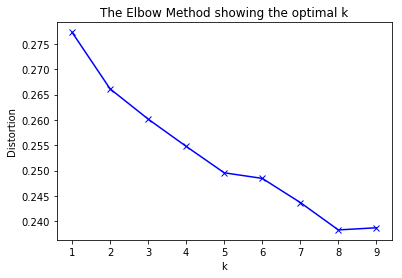

In [87]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(moscow_grouped_clustering)
    kmeanModel.fit(moscow_grouped_clustering)
    distortions.append(sum(np.min(cdist(moscow_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / moscow_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

It seems like the optimal number of clusters could be 5 and 8. I've checked the 8 number of clusters and it actually creates 3 real clusters and 5 other with just the one venue (array([0, 0, 0, 7, 0, 3, 0, 0])). Let's check 5 clusters

In [89]:
kclusters = 5

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(moscow_grouped_clustering)
kmeans.labels_[0:5]

array([1, 1, 2, 2, 1], dtype=int32)

Data preparation for clustering

In [90]:
moscow_grouped1=df19[['District_en', 'Work/residential district', 'Price categories', 'Latitude', 'Longitude']]

In [91]:
moscow_grouped1.set_index('District_en', inplace = True)

In [92]:
moscow_grouped2 = moscow_grouped1.sort_values('District_en', ascending=True)

In [93]:
moscow_grouped3=moscow_grouped2.reset_index()
moscow_grouped3.head()

,District_en,Work/residential district,Price categories,Latitude,Longitude
0,Aeroport District,mostly for work,average,55.800402,37.533156
1,Akademichesky District,residential,average,55.689738,37.576771
2,Alexeyevsky District,mostly for work,mass-segment,55.814878,37.650668
3,Altufyevsky District,residential,mass-segment,55.880255,37.581635
4,Arbat District,mostly for work,expensive,55.751199,37.589872


In [94]:
moscow_grouped4 = moscow_grouped3.rename({'District_en': 'Neighborhood'}, axis=1) 

In [95]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

moscow_merged = moscow_grouped4


moscow_merged = moscow_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

moscow_merged

,Neighborhood,Work/residential district,Price categories,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Aeroport District,mostly for work,average,55.800402,37.533156,1,Coffee Shop,Café,Cosmetics Shop,Flower Shop,Convenience Store
1,Akademichesky District,residential,average,55.689738,37.576771,1,Park,Beer Store,Pharmacy,Coffee Shop,Sushi Restaurant
2,Alexeyevsky District,mostly for work,mass-segment,55.814878,37.650668,2,Auto Workshop,Hotel,Supermarket,Pizza Place,Gym / Fitness Center
3,Altufyevsky District,residential,mass-segment,55.880255,37.581635,2,Supermarket,Health Food Store,Food & Drink Shop,Grocery Store,Salon / Barbershop
4,Arbat District,mostly for work,expensive,55.751199,37.589872,1,Coffee Shop,Hotel,Caucasian Restaurant,Yoga Studio,Hostel
5,Babushkinsky District,residential,mass-segment,55.865958,37.663894,2,Pharmacy,Cosmetics Shop,Middle Eastern Restaurant,Beer Store,Gym
6,Basmanny District,mostly for work,average,55.767281,37.669773,1,History Museum,Park,Recording Studio,Dance Studio,Restaurant
7,Begovoy District,mostly for work,average,55.781917,37.566300,1,Dance Studio,Gym / Fitness Center,Hotel Bar,Hotel,Café
8,Beskudnikovsky District,residential,mass-segment,55.863739,37.557322,2,Cosmetics Shop,Farmers Market,Eastern European Restaurant,Fried Chicken Joint,Moving Target
9,Bibirevo District,residential,mass-segment,55.883894,37.603577,1,Fast Food Restaurant,Clothing Store,Eastern European Restaurant,Pet Store,Cosmetics Shop


Clusters map creation: 

In [96]:
import matplotlib.cm as cm
import matplotlib.colors as colors

In [97]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)


x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


markers_colors = []
for lat, lon, poi, cluster in zip(moscow_merged['Latitude'], moscow_merged['Longitude'], moscow_merged['Neighborhood'], moscow_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-3],
        fill=True,
        fill_color=rainbow[cluster-3],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Results. Cluster 1 is not really the cluster as it represents just the 1 district out of the border of actual Moscow.

In [98]:
cluster1 = moscow_merged.loc[moscow_merged['Cluster Labels'] == 0]
cluster_1=cluster1.drop(['Latitude','Longitude','Cluster Labels'], axis=1)
cluster_1

,Neighborhood,Work/residential district,Price categories,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
87,Severny District,mostly for work,mass-segment,Playground,Supermarket,Pizza Place,Food Court,Fast Food Restaurant


As there are 68 districts in the Cluster 2, let's initially divide it into work/residential districts:

In [100]:
cluster2 = moscow_merged.loc[moscow_merged['Cluster Labels'] == 1]
cluster_2=cluster2.drop(['Latitude','Longitude','Cluster Labels'], axis=1)
cluster_2_1 = cluster_2.loc[cluster_2['Work/residential district'] == 'mostly for work']
cluster_2_2=cluster_2_1.sort_values('Price categories', ascending=True)
cluster_2_2

,Neighborhood,Work/residential district,Price categories,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Aeroport District,mostly for work,average,Coffee Shop,Café,Cosmetics Shop,Flower Shop,Convenience Store
6,Basmanny District,mostly for work,average,History Museum,Park,Recording Studio,Dance Studio,Restaurant
7,Begovoy District,mostly for work,average,Dance Studio,Gym / Fitness Center,Hotel Bar,Hotel,Café
95,Tagansky District,mostly for work,average,Café,Bar,Coffee Shop,Pharmacy,Health Food Store
91,Sokolniki District,mostly for work,average,Sporting Goods Shop,Health Food Store,Theater,Gourmet Shop,Clothing Store
22,Dorogomilovo District,mostly for work,average,Coffee Shop,Wine Shop,Boutique,Salon / Barbershop,Farmers Market
89,Sokol District,mostly for work,average,Park,Coffee Shop,Cosmetics Shop,Gym / Fitness Center,Performing Arts Venue
109,Yakimanka District,mostly for work,expensive,Café,Coffee Shop,Art Gallery,Gym / Fitness Center,Indie Movie Theater
100,Tverskoy District,mostly for work,expensive,Theater,Coffee Shop,Seafood Restaurant,Yoga Studio,Music Venue
77,Presnensky District,mostly for work,expensive,Gym / Fitness Center,Coffee Shop,Café,Board Shop,Music Venue


Clustering for residential areas:

In [102]:
cluster_2_3 = cluster_2.loc[cluster_2['Work/residential district'] == 'residential']
cluster_2_4=cluster_2_3.sort_values('Price categories', ascending=True)
cluster_2_4

,Neighborhood,Work/residential district,Price categories,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1,Akademichesky District,residential,average,Park,Beer Store,Pharmacy,Coffee Shop,Sushi Restaurant
78,Prospekt Vernadskogo District,residential,average,Cosmetics Shop,Flower Shop,Ice Cream Shop,Eastern European Restaurant,Travel Agency
79,Ramenki District,residential,average,Italian Restaurant,Supermarket,Salon / Barbershop,Spa,Café
18,Cheryomushki District,residential,average,Convenience Store,Spa,Café,Italian Restaurant,Supermarket
24,Filyovsky park District,residential,average,Plaza,Health Food Store,Supermarket,Convenience Store,Seafood Restaurant
25,Gagarinsky District,residential,average,Hotel,Furniture / Home Store,Korean Restaurant,Dive Shop,Pizza Place
47,Lomonosovsky District,residential,average,Kids Store,Convenience Store,Bakery,Café,Gym / Fitness Center
40,Krylatskoye District,residential,average,Coffee Shop,Pet Store,Supermarket,Mobile Phone Shop,Farmers Market
76,Preobrazhenskoye District,residential,mass-segment,Coffee Shop,Dance Studio,Bookstore,Arcade,Health Food Store
83,Severnoye Butovo District,residential,mass-segment,Park,Health Food Store,Ice Cream Shop,Bookstore,Beer Bar


In [103]:
cluster3 = moscow_merged.loc[moscow_merged['Cluster Labels'] == 2]
cluster_3=cluster3.drop(['Latitude','Longitude','Cluster Labels'], axis=1)
cluster_3

,Neighborhood,Work/residential district,Price categories,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
2,Alexeyevsky District,mostly for work,mass-segment,Auto Workshop,Hotel,Supermarket,Pizza Place,Gym / Fitness Center
3,Altufyevsky District,residential,mass-segment,Supermarket,Health Food Store,Food & Drink Shop,Grocery Store,Salon / Barbershop
5,Babushkinsky District,residential,mass-segment,Pharmacy,Cosmetics Shop,Middle Eastern Restaurant,Beer Store,Gym
8,Beskudnikovsky District,residential,mass-segment,Cosmetics Shop,Farmers Market,Eastern European Restaurant,Fried Chicken Joint,Moving Target
10,Biryulyovo Vostochnoye District,residential,mass-segment,Supermarket,Restaurant,Outlet Store,Light Rail Station,Cosmetics Shop
13,Brateyevo District,residential,mass-segment,Pizza Place,Supermarket,Pedestrian Plaza,Big Box Store,Shopping Mall
17,Chertanovo Yuzhnoye District,residential,mass-segment,Pedestrian Plaza,Japanese Restaurant,Supermarket,Men's Store,Pizza Place
20,Dmitrovsky District,residential,mass-segment,Supermarket,Bus Stop,Bath House,Eastern European Restaurant,Pizza Place
23,Fili-Davydkovo District,residential,mass-segment,Cosmetics Shop,Electronics Store,Supermarket,Convenience Store,Beer Bar
28,Ivanovskoye District,residential,mass-segment,Supermarket,Cosmetics Shop,Department Store,Shopping Mall,Gym


In [104]:
cluster4 = moscow_merged.loc[moscow_merged['Cluster Labels'] == 3]
cluster_4=cluster4.drop(['Latitude','Longitude','Cluster Labels'], axis=1)
cluster_4

,Neighborhood,Work/residential district,Price categories,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
11,Biryulyovo Zapadnoye District,residential,mass-segment,Bus Stop,Pizza Place,Big Box Store,Zoo Exhibit,Fountain
12,Bogorodskoye District,residential,mass-segment,Bus Stop,Supermarket,Food & Drink Shop,Pizza Place,Grocery Store
34,Khovrino District,residential,mass-segment,Bus Stop,Supermarket,Park,Auto Workshop,Campground
54,Metrogorodok District,residential,mass-segment,Supermarket,Bus Stop,Tram Station,Food & Drink Shop,Sushi Restaurant
65,Novogireyevo District,residential,mass-segment,Bus Stop,Movie Theater,Gym / Fitness Center,Food & Drink Shop,Café
69,Orekhovo-Borisovo Severnoye District,residential,mass-segment,Convenience Store,Bus Stop,Dairy Store,Pharmacy,Grocery Store
92,Solntsevo District,residential,mass-segment,Bus Stop,ATM,Art Gallery,Convenience Store,Cosmetics Shop
106,Vostochny District,residential,mass-segment,Supermarket,Convenience Store,Bus Stop,Big Box Store,Farmers Market


In [106]:
cluster5 = moscow_merged.loc[moscow_merged['Cluster Labels'] == 4]
cluster_5=cluster5.drop(['Latitude','Longitude','Cluster Labels'], axis=1)
cluster_5

,Neighborhood,Work/residential district,Price categories,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
63,Nizhegorodsky District,mostly for work,average,Auto Workshop,Convenience Store,Café,Supermarket,Bar
68,Ochakovo-Matveyevskoye District,residential,mass-segment,Auto Workshop,Buffet,Automotive Shop,Zoo Exhibit,Food Court
97,Timiryazevsky District,residential,mass-segment,Garden,Tram Station,Auto Workshop,Farmers Market,Zoo Exhibit


### Results:
Actually this kind of clustering shows that is works well when there is a small number of districts inside the cluster (as for cluster 4 and 5). But really this analysis is done to show that i can do clustering as there are no some valuable results in clustering districts of Moscow in a manner i did it.

Though a map of Moscow districts with the most popular venues inside each district and districts classified by real estate price, size of population and 'for work'/residential status may have some novelty and add some new knowledge:

# 4. Visualized outcomes of district analysis: 

Outcomes will be three chronolepth maps with clusters, work/residential status of district, real estate price and population indication alongside with the three most popular venues types in popup district label. This information will be helpful for benchmarking studies of districts similar by other indicators.  

In [108]:
moscow_merged['3_mp_venues'] = ['The most popular venues for ']+moscow_merged['Neighborhood']+[' are: ']+moscow_merged['1st Most Common Venue']+[', ']+moscow_merged['2nd Most Common Venue']+[', ']+moscow_merged['3rd Most Common Venue']
moscow_merged.head()

,Neighborhood,Work/residential district,Price categories,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,3_mp_venues
0,Aeroport District,mostly for work,average,55.800402,37.533156,1,Coffee Shop,Café,Cosmetics Shop,Flower Shop,Convenience Store,The most popular venues for Aeroport District ...
1,Akademichesky District,residential,average,55.689738,37.576771,1,Park,Beer Store,Pharmacy,Coffee Shop,Sushi Restaurant,The most popular venues for Akademichesky Dist...
2,Alexeyevsky District,mostly for work,mass-segment,55.814878,37.650668,2,Auto Workshop,Hotel,Supermarket,Pizza Place,Gym / Fitness Center,The most popular venues for Alexeyevsky Distri...
3,Altufyevsky District,residential,mass-segment,55.880255,37.581635,2,Supermarket,Health Food Store,Food & Drink Shop,Grocery Store,Salon / Barbershop,The most popular venues for Altufyevsky Distri...
4,Arbat District,mostly for work,expensive,55.751199,37.589872,1,Coffee Shop,Hotel,Caucasian Restaurant,Yoga Studio,Hostel,The most popular venues for Arbat District are...


In [109]:
df21 = df19[['District_en', 'Price per sq m', 'Dummies for work/residential district','Population']]

In [110]:
df21.set_index('District_en', inplace = True)

In [111]:
df22 = df21.sort_values('District_en', ascending=True)

In [112]:
df23 = df22.rename({'District_en': 'Neighborhood'}, axis=1) 

In [113]:
df24=df23.reset_index()

In [114]:
df25 = pd.merge(moscow_merged, df24, left_index=True, right_index=True, how='outer')
df25.head()

,Neighborhood,Work/residential district,Price categories,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,3_mp_venues,District_en,Price per sq m,Dummies for work/residential district,Population
0,Aeroport District,mostly for work,average,55.800402,37.533156,1,Coffee Shop,Café,Cosmetics Shop,Flower Shop,Convenience Store,The most popular venues for Aeroport District ...,Aeroport District,206218,1,79486
1,Akademichesky District,residential,average,55.689738,37.576771,1,Park,Beer Store,Pharmacy,Coffee Shop,Sushi Restaurant,The most popular venues for Akademichesky Dist...,Akademichesky District,205702,0,109387
2,Alexeyevsky District,mostly for work,mass-segment,55.814878,37.650668,2,Auto Workshop,Hotel,Supermarket,Pizza Place,Gym / Fitness Center,The most popular venues for Alexeyevsky Distri...,Alexeyevsky District,191495,1,80534
3,Altufyevsky District,residential,mass-segment,55.880255,37.581635,2,Supermarket,Health Food Store,Food & Drink Shop,Grocery Store,Salon / Barbershop,The most popular venues for Altufyevsky Distri...,Altufyevsky District,147175,0,57596
4,Arbat District,mostly for work,expensive,55.751199,37.589872,1,Coffee Shop,Hotel,Caucasian Restaurant,Yoga Studio,Hostel,The most popular venues for Arbat District are...,Arbat District,362197,1,36125


Map with price classification and the top-3 most popular venues in every district

In [115]:
map_moscow_merged = folium.Map(location=[latitude, longitude], zoom_start=11)
map_moscow_merged.choropleth(geo_data=output, data=df25,
             columns=['Neighborhood', 'Price per sq m'],
             key_on='feature.properties.NAME_EN',
             fill_color='YlOrRd', fill_opacity=0.8, line_opacity=0.4,
             legend_name='Price per sq m')
map_moscow_merged

for lat, lng, label in zip(df25['Latitude'], df25['Longitude'], df25['3_mp_venues']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_moscow_merged)
map_moscow_merged

Map with for work/residential feature of district and the top-3 most popular venues in every district

In [116]:
map_moscow_merged1 = folium.Map(location=[latitude, longitude], zoom_start=11)
map_moscow_merged1.choropleth(geo_data=output, data=df25,
             columns=['Neighborhood', 'Dummies for work/residential district'],
             key_on='feature.properties.NAME_EN',
             fill_color='BuPu', fill_opacity=0.8, line_opacity=0.4,
             legend_name='where 0 is for residential district, 1 - mostly for work district')

for lat, lng, label in zip(df25['Latitude'], df25['Longitude'], df25['3_mp_venues']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='black',
        fill=True,
        fill_color='#060112',
        fill_opacity=0.7,
        parse_html=False).add_to(map_moscow_merged1)
map_moscow_merged1

Map with population size every district and the top-3 most popular venues there

In [117]:
map_moscow_merged2 = folium.Map(location=[latitude, longitude], zoom_start=11)
map_moscow_merged2.choropleth(geo_data=output, data=df25,
             columns=['Neighborhood', 'Population'],
             key_on='feature.properties.NAME_EN',
             fill_color='YlOrRd', fill_opacity=0.8, line_opacity=0.4,
             legend_name='Population size')

for lat, lng, label in zip(df25['Latitude'], df25['Longitude'], df25['3_mp_venues']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='black',
        fill=True,
        fill_color='#060112',
        fill_opacity=0.7,
        parse_html=False).add_to(map_moscow_merged2)
map_moscow_merged2

Further i willing to analyse venues from OpenStreetMap, i expect to find there more objective picture reflecting the number and location of venues in Moscow. I also want to analyse data on other cities of Russia, calculate ratios related to venues number and location with some socioeconomic indicators and make a comparison of cities. But i guess i need a higher level of data science skills to do it effectively.